# Mounting Google Drive

mounting drive, setting root path to CelebA Dataset, setting device to cuda, checking out GPU


In [8]:
# Mount Drive:
from google.colab import drive
drive.mount('/content/gdrive')

# Set root-path to dataset:
import os
root_path = '/content/gdrive/MyDrive/Colab/WGAN-GT/' 
os.chdir(root_path)
!ls

# Set-up Device:
import torch
device = torch.device('cpu')
if torch.cuda.is_available():
    device = torch.device('cuda')
print(device)

# Print GPU details:
!nvidia-smi

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
celeb_dataset  logs  WGAN-GT.ipynb
cuda
Sat Aug 28 08:36:43 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    26W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A

# **Setting up Discriminator and Generator**
defining discrimintor and generator according to DCGAN paper's architecture




In [9]:
import torch
import torch.nn as nn

"""
Basic implementation of Generator & Discriminator (a like DCGAN),
isn't really according to paper, just for very fast and basic training later on.
"""

class Discriminator(nn.Module):
    def __init__(self, img_channels, features_d):
        super(Discriminator, self).__init__() # treats input as N x IMG_CHs x 64 x 64
        self.disc = nn.Sequential(
            nn.Conv2d(img_channels, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d*2, 4, 2, 1),
            self._block(features_d*2, features_d*4, 4, 2, 1),
            self._block(features_d*4, features_d*8, 4, 2, 1),
            # Above sequence of layers results in 4x4 output (when starting at 64x64), the below layer turns it to 1x1:
            nn.Conv2d(features_d*8, 1, kernel_size=4, stride=2, padding=0),
        )



    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
            return self.disc(x)

class Generator(nn.Module):
    def __init__(self, latent_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(latent_dim, features_g * 16, 4, 1, 0),  # img: 4x4
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # img: 8x8
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # img: 16x16
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # img: 32x32
            nn.ConvTranspose2d(features_g * 2, channels_img, kernel_size=4, stride=2, padding=1),
            # Until this layer we get: N x channels_img x 64 x 64
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)


# Initializes weights according to the DCGAN paper
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02) # init' weights are drawn from normal dist' with mu=0, sigma=0.02


def test():
    N, in_channels, H, W = 8, 3, 64, 64
    z_latent_space_dim = 100
    x = torch.randn((N, in_channels, H, W))
    disc = Discriminator(in_channels, 8)
    assert disc(x).shape == (N, 1, 1, 1), "Discriminator test failed"
    gen = Generator(z_latent_space_dim, in_channels, 8)
    z = torch.randn((N, z_latent_space_dim, 1, 1))
    assert gen(z).shape == (N, in_channels, H, W), "Generator test failed"

#test()

# Gradient Penalty

defining function for gradient penalty (Line 7. in the training algorithm)

In [12]:
import torch
import torch.nn as nn

def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    #epsilon = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device) # used in line 6. in the training algorithm
    epsilon = torch.rand((BATCH_SIZE, 1, 1, 1)).to(device)
    interpolated_images = real * epsilon + fake * (1 - epsilon) # ^^ (according to prop.1 in paper)

    # Calculating critic scores:
    mixed_scores = critic(interpolated_images) # line 7. Dw(x^)

    # Calculating Gradient of Dw(x^) wrt to x^:
    gradient = torch.autograd.grad( # .grad = Computes and returns the sum of gradients of outputs wrt the inputs (in our case, interpolated_images).
        # unlike .backward which computes w.r.t graph leaves.
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0] # returns a tuple

    gradient = gradient.view(gradient.shape[0], -1) # flatten (grad.shape[0] = num of samples)
    gradient_norm = gradient.norm(2, dim=1) # taking L2 norm
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2) # Line 7.
    return gradient_penalty

# Training according to:
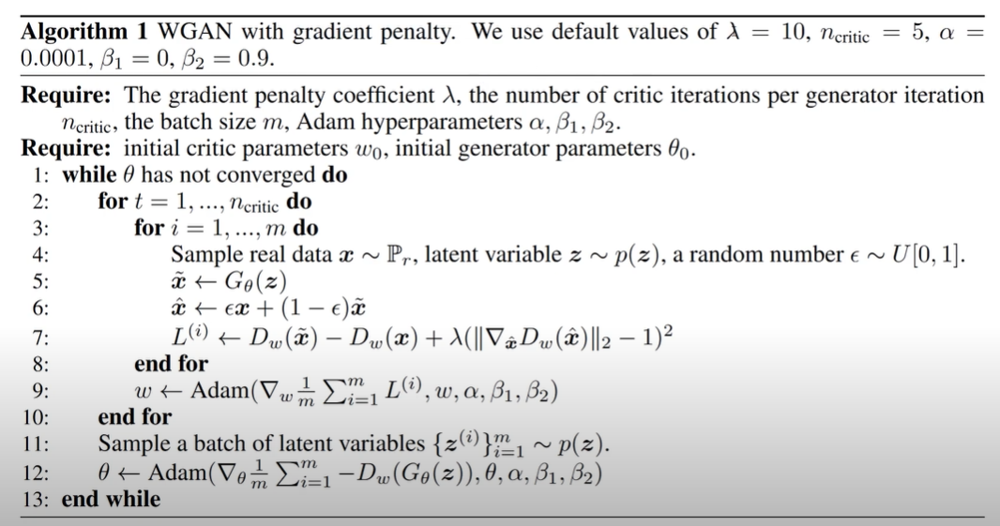

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter


# GLOBALS:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4 # according to paper
BATCH_SIZE = 64 # according to paper (m=64)
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 128
NUM_EPOCHS = 5
FEATURES_CRITIC = 64
FEATURES_GEN = 64
CRITIC_ITERATIONS = 5 # according to paper, this tells how many iterations we perform over discriminator, per a single iteration over generator
LAMBDA_GP = 10 # gradient penalty lambda according to paper


# Data augmentations:
transforms = transforms.Compose(
    [
        transforms.Resize((IMAGE_SIZE,IMAGE_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)

# Initialize dataset & dataloader:
dataset = datasets.ImageFolder(root="celeb_dataset", transform=transforms)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

# Initialize generator and discriminator(aka critic) & its' weights:
generator = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(DEVICE)
discriminator = Discriminator(CHANNELS_IMG, FEATURES_CRITIC).to(DEVICE)
initialize_weights(generator)
initialize_weights(discriminator)

# Initialize optimizers:
opt_generator = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9)) # RMSprop is now changed to Adam which is used in the paper.
opt_disc = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(DEVICE)
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")
step = 0

generator.train()
discriminator.train()

# Perform training:
for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _) in enumerate(dataloader):
        real = real.to(DEVICE)

        # Train Discriminator according to wgan-formula:
        for _ in range(CRITIC_ITERATIONS):
            # Generate fake images out of random latent space z:
            z_vector = torch.randn(BATCH_SIZE, Z_DIM, 1, 1).to(DEVICE)
            fake = generator(z_vector)

            # Propagate thourgh disc' & calculate loss:
            disc_real = discriminator(real).reshape(-1)
            disc_fake = discriminator(fake).reshape(-1)
            gp = gradient_penalty(discriminator, real, fake, device=DEVICE)
            loss_disc = -(torch.mean(disc_real) - torch.mean(disc_fake)) + LAMBDA_GP * gp # the 1st '-' is because we'd like to optimize that expression, yet torch-optimizer minimize by default.

            # Backprop' & update disc' weights:
            discriminator.zero_grad()
            loss_disc.backward(retain_graph=True)
            opt_disc.step()

            # CLIPPING IS REMOVED.


        # Train Generator ( according to -E[critic(generator(z))] ):
        output = discriminator(fake).reshape(-1)
        loss_gen = -torch.mean(output)
        generator.zero_grad()
        loss_gen.backward()
        opt_generator.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0 and batch_idx > 0:
            generator.eval()
            discriminator.eval()
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                        Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = generator(z_vector)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1
            generator.train()
            discriminator.train()



# Tensorboard initialization

In [14]:
%load_ext tensorboard
%tensorboard --logdir logs 


Output hidden; open in https://colab.research.google.com to view.